In [125]:
import pandas as pdimport numpy as npimport matplotlib.pyplot as pltimport seaborn as snsfrom sklearn.cluster import KMeansfrom sklearn.preprocessing import RobustScalerimport warningswarnings.filterwarnings('ignore')%matplotlib inline%pip install geopandassns.set_theme(style="whitegrid")plt.rcParams['figure.figsize'] = (12, 7)plt.rcParams['font.size'] = 10\n


Note: you may need to restart the kernel to use updated packages.


In [126]:
import osDATA_PATH = '/Users/muhammadrizalhafiyyan/Documents/kendaraan pdrb ah enak/'print("📂 File CSV di folder:")for f in os.listdir(DATA_PATH):    if f.endswith('.csv'):        print(f"  ✓ {f}")\n


📂 File CSV di folder:
  ✓ hasil_analisis_clustering_jatim_2cluster.csv
  ✓ hasil_clustering_pkn_pkw_jatim.csv
  ✓ Jumlah Kendaraan Bermotor Menurut Kabupaten_Kota dan Jenis Kendaraan di Provinsi Jawa Timur (unit), 2024.csv
  ✓ Jumlah Kendaraan Bermotor Menurut Kabupaten_Kota dan Jenis Kendaraan di Provinsi Jawa Timur (unit), 2023.csv
  ✓ Penduduk, Laju Pertumbuhan Penduduk, Distribusi Persentase Penduduk Kepadatan Penduduk, Rasio Jenis Kelamin Penduduk Menurut Kabupaten_Kota di Provinsi Jawa Timur, 2023.csv
  ✓ Produk Domestik Regional Bruto (PDRB) Triwulanan Menurut Kabupaten_Kota Atas Dasar Harga Konstan Provinsi Jawa Timur, 2024.csv
  ✓ Produk Domestik Regional Bruto (PDRB) Triwulanan Menurut Kabupaten_Kota Atas Dasar Harga Konstan Provinsi Jawa Timur, 2023.csv
  ✓ Penduduk, Laju Pertumbuhan Penduduk, Distribusi Persentase Penduduk Kepadatan Penduduk, Rasio Jenis Kelamin Penduduk Menurut Kabupaten_Kota di Provinsi Jawa Timur, 2024.csv


In [127]:
filenames = {    'pdrb_23': DATA_PATH + 'Produk Domestik Regional Bruto (PDRB) Triwulanan Menurut Kabupaten_Kota Atas Dasar Harga Konstan Provinsi Jawa Timur, 2023.csv',    'pdrb_24': DATA_PATH + 'Produk Domestik Regional Bruto (PDRB) Triwulanan Menurut Kabupaten_Kota Atas Dasar Harga Konstan Provinsi Jawa Timur, 2024.csv',    'veh_23': DATA_PATH + 'Jumlah Kendaraan Bermotor Menurut Kabupaten_Kota dan Jenis Kendaraan di Provinsi Jawa Timur (unit), 2023.csv',    'veh_24': DATA_PATH + 'Jumlah Kendaraan Bermotor Menurut Kabupaten_Kota dan Jenis Kendaraan di Provinsi Jawa Timur (unit), 2024.csv',    'pop_23': DATA_PATH + 'Penduduk, Laju Pertumbuhan Penduduk, Distribusi Persentase Penduduk Kepadatan Penduduk, Rasio Jenis Kelamin Penduduk Menurut Kabupaten_Kota di Provinsi Jawa Timur, 2023.csv',    'pop_24': DATA_PATH + 'Penduduk, Laju Pertumbuhan Penduduk, Distribusi Persentase Penduduk Kepadatan Penduduk, Rasio Jenis Kelamin Penduduk Menurut Kabupaten_Kota di Provinsi Jawa Timur, 2024.csv',}def clean_name(name):        name = str(name).strip()    name = name.replace('Kabupaten ', '').replace('Kab. ', '')    name = name.upper()    return namedf_p23 = pd.read_csv(filenames['pdrb_23'], skiprows=3)df_p23 = df_p23.rename(columns={'Unnamed: 0': 'City', 'Tahunan': 'PDRB_2023'})df_p23 = df_p23[['City', 'PDRB_2023']].dropna()df_p23['City'] = df_p23['City'].apply(clean_name)df_p23['PDRB_2023'] = df_p23['PDRB_2023'] / 1000df_p24 = pd.read_csv(filenames['pdrb_24'], skiprows=3)df_p24 = df_p24.rename(columns={'Unnamed: 0': 'City', 'Tahunan': 'PDRB_2024'})df_p24 = df_p24[['City', 'PDRB_2024']].dropna()df_p24['City'] = df_p24['City'].apply(clean_name)df_p24['PDRB_2024'] = df_p24['PDRB_2024'] / 1000df_v23 = pd.read_csv(filenames['veh_23'])df_v23 = df_v23.rename(columns={'Kabupaten/Kota': 'City', 'Jumlah Kendaraan Bermotor - Jumlah': 'Veh_2023'})df_v23 = df_v23[['City', 'Veh_2023']].dropna()df_v23['City'] = df_v23['City'].apply(clean_name)df_v23['Veh_2023'] = df_v23['Veh_2023'] / 1000df_v24 = pd.read_csv(filenames['veh_24'])df_v24 = df_v24.rename(columns={'Kabupaten/Kota': 'City', 'Jumlah Kendaraan Bermotor - Jumlah': 'Veh_2024'})df_v24 = df_v24[['City', 'Veh_2024']].dropna()df_v24['City'] = df_v24['City'].apply(clean_name)df_v24['Veh_2024'] = df_v24['Veh_2024'] / 1000df_pop23 = pd.read_csv(filenames['pop_23'])df_pop23 = df_pop23.rename(columns={    'Kabupaten/Kota': 'City',     'Jumlah Penduduk (Ribu)': 'Pop_2023',    'Kepadatan Penduduk per km persegi (Km2)': 'Kepadatan_2023'})df_pop23 = df_pop23[['City', 'Pop_2023', 'Kepadatan_2023']].dropna()df_pop23['City'] = df_pop23['City'].apply(clean_name)df_pop24 = pd.read_csv(filenames['pop_24'])df_pop24 = df_pop24.rename(columns={    'Kabupaten/Kota': 'City',     'Jumlah Penduduk (Ribu)': 'Pop_2024',    'Kepadatan Penduduk per km persegi (Km2)': 'Kepadatan_Penduduk'})df_pop24 = df_pop24[['City', 'Pop_2024', 'Kepadatan_Penduduk']].dropna()df_pop24['City'] = df_pop24['City'].apply(clean_name)df = pd.merge(df_p23, df_p24, on='City')df = pd.merge(df, df_v23, on='City')df = pd.merge(df, df_v24, on='City')df = pd.merge(df, df_pop23, on='City')df = pd.merge(df, df_pop24, on='City')exclude_list = ['JAWA TIMUR', 'PROVINSI', 'CATATAN', 'TOTAL', 'NAN']df = df[~df['City'].str.contains('|'.join(exclude_list), na=False)]df['Jenis_Wilayah'] = df['City'].apply(lambda x: 'KOTA' if 'KOTA' in x else 'KABUPATEN')print(f"✓ Berhasil menggabungkan {len(df)} Kabupaten/Kota di Jawa Timur.")print(f"  - Kabupaten: {len(df[df['Jenis_Wilayah']=='KABUPATEN'])}")print(f"  - Kota: {len(df[df['Jenis_Wilayah']=='KOTA'])}")print("\n📊 SATUAN DATA (semua dalam Ribu):")print("  • PDRB: Ribu Miliar Rupiah (= Triliun Rp)")print("  • Kendaraan: Ribu unit")print("  • Penduduk: Ribu jiwa")print("  • Kepadatan Penduduk: jiwa/km² (BARU)")df.head()\n


✓ Berhasil menggabungkan 38 Kabupaten/Kota di Jawa Timur.
  - Kabupaten: 29
  - Kota: 9

📊 SATUAN DATA (semua dalam Ribu):
  • PDRB: Ribu Miliar Rupiah (= Triliun Rp)
  • Kendaraan: Ribu unit
  • Penduduk: Ribu jiwa
  • Kepadatan Penduduk: jiwa/km² (BARU)


,City,PDRB_2023,PDRB_2024,Veh_2023,Veh_2024,Pop_2023,Kepadatan_2023,Pop_2024,Kepadatan_Penduduk,Jenis_Wilayah
0,PACITAN,12.24497,12.77582,218.987,224.540,588.0,410.0,588.6,411.0,KABUPATEN
1,PONOROGO,15.87005,16.62278,581.926,601.378,959.5,676.0,962.9,679.0,KABUPATEN
2,TRENGGALEK,14.21206,14.88155,554.194,584.457,741.2,593.0,744.5,596.0,KABUPATEN
3,TULUNGAGUNG,30.23461,31.70389,862.189,896.054,1107.8,968.0,1113.9,973.0,KABUPATEN
4,BLITAR,28.23986,29.49380,636.464,680.512,1253.6,718.0,1263.7,724.0,KABUPATEN


In [128]:
df['Pop_2023_ribu'] = df['Pop_2023']df['Pop_2024_ribu'] = df['Pop_2024']df['PDRB_per_Capita'] = (df['PDRB_2024'] * 1000) / df['Pop_2024_ribu']df['Motorization_Rate'] = (df['Veh_2024'] / df['Pop_2024_ribu']) * 1000df['PDRB_Growth_%'] = ((df['PDRB_2024'] - df['PDRB_2023']) / df['PDRB_2023']) * 100df['Veh_Growth_%'] = ((df['Veh_2024'] - df['Veh_2023']) / df['Veh_2023']) * 100from scipy import statsdf['Elasticity_Simple'] = np.clip(    df['Veh_Growth_%'] / df['PDRB_Growth_%'].replace(0, np.nan),    -10, 20)log_veh = np.log(df['Veh_2024'] * 1000)log_pdrb = np.log(df['PDRB_2024'] * 1000)slope, intercept, r_value, p_value, std_err = stats.linregress(log_pdrb, log_veh)print("="*70)print("📊 ELASTICITY ANALYSIS (Log-Log Regression)")print("="*70)print(f"   Model: ln(Kendaraan) = α + β·ln(PDRB)")print(f"   β (Elasticity)  = {slope:.4f}")print(f"   R² (Fit)        = {r_value**2:.4f}")print(f"   p-value         = {p_value:.2e}")print(f"\n   Interpretasi: Setiap 1% kenaikan PDRB → {slope:.2f}% kenaikan kendaraan")GLOBAL_ELASTICITY = slopedf['Elasticity'] = (    (df['Veh_2024'] - df['Veh_2023']) / ((df['Veh_2024'] + df['Veh_2023']) / 2)) / (    (df['PDRB_2024'] - df['PDRB_2023']) / ((df['PDRB_2024'] + df['PDRB_2023']) / 2))df['Elasticity'] = np.clip(df['Elasticity'], -5, 10)df['Log_PDRB_per_Capita'] = np.log1p(df['PDRB_per_Capita'])print("\n" + "="*70)print("📊 VALIDASI DATA UNTUK CLUSTERING")print("="*70)growth_cols = ['PDRB_Growth_%', 'Veh_Growth_%']for col in growth_cols:    neg_count = (df[col] < 0).sum()    min_val = df[col].min()    print(f"   {col}: {neg_count} nilai negatif, min = {min_val:.2f}%")if (df[growth_cols] < 0).any().any():    print("\n   ⚠️ CATATAN: Ada nilai negatif pada growth variables.")    print("      RobustScaler mempertahankan tanda (+/-), yang mempengaruhi K-Means.")else:    print("\n   ✓ Semua growth values positif - tidak ada masalah dengan scaling.")print("\n" + "="*70)print("📊 STATISTIK DESKRIPTIF INDIKATOR")print("="*70)stats_cols = ['PDRB_Growth_%', 'Veh_Growth_%', 'Motorization_Rate',               'PDRB_per_Capita', 'Kepadatan_Penduduk', 'Elasticity']print(df[stats_cols].describe().round(2))print("\n" + "="*70)print("📈 KORELASI ANTAR VARIABEL (dengan Kepadatan)")print("="*70)print(df[['PDRB_Growth_%', 'Veh_Growth_%', 'Motorization_Rate',           'PDRB_per_Capita', 'Kepadatan_Penduduk']].corr().round(3))\n


📊 ELASTICITY ANALYSIS (Log-Log Regression)
   Model: ln(Kendaraan) = α + β·ln(PDRB)
   β (Elasticity)  = 0.4705
   R² (Fit)        = 0.5981
   p-value         = 1.25e-08

   Interpretasi: Setiap 1% kenaikan PDRB → 0.47% kenaikan kendaraan

📊 VALIDASI DATA UNTUK CLUSTERING
   PDRB_Growth_%: 0 nilai negatif, min = 1.67%
   Veh_Growth_%: 0 nilai negatif, min = 2.53%

   ✓ Semua growth values positif - tidak ada masalah dengan scaling.

📊 STATISTIK DESKRIPTIF INDIKATOR
       PDRB_Growth_%  Veh_Growth_%  Motorization_Rate  PDRB_per_Capita  \
count          38.00         38.00              38.00            38.00   
mean            4.63          5.69             760.83            45.46   
std             0.98          3.34             455.10            53.91   
min             1.67          2.53             273.43            14.69   
25%             4.65          3.55             455.88            20.86   
50%             4.84          4.91             614.64            24.27   
75%         

### 📊 HISTOGRAM DISTRIBUSI VARIABEL

📊 HISTOGRAM DISTRIBUSI VARIABEL UTAMA

1. PDRB 2024 (Triliun Rp)
   Mean: 50.94 | Median: 26.54 | Std: 81.53
   Min: 5.69 | Max: 485.45

2. Penduduk 2024 (Ribu jiwa)
   Mean: 1100.39 | Median: 1108.20 | Std: 686.89
   Min: 137.40 | Max: 2922.00

3. Kendaraan 2024 (Ribu unit)
   Mean: 698.09 | Median: 596.12 | Std: 612.79
   Min: 224.54 | Max: 3806.24

4. PDRB per Capita (Juta Rp/orang)
   Mean: 45.46 | Median: 24.27 | Std: 53.91
   Min: 14.69 | Max: 317.82

5. Kepadatan Penduduk (jiwa/km²)
   Mean: 1954.29 | Median: 862.50 | Std: 2280.86
   Min: 411.00 | Max: 8698.00

6. Motorization Rate (kendaraan/1000 penduduk)
   Mean: 760.83 | Median: 614.64 | Std: 455.10
   Min: 273.43 | Max: 2248.48

7. Pertumbuhan PDRB (%)
   Mean: 4.63 | Median: 4.84 | Std: 0.98
   Min: 1.67 | Max: 5.76

8. Pertumbuhan Kendaraan (%)
   Mean: 5.69 | Median: 4.91 | Std: 3.34
   Min: 2.53 | Max: 17.96

9. Log PDRB per Capita
   Mean: 3.54 | Median: 3.23 | Std: 0.67
   Min: 2.75 | Max: 5.76

✓ Histogram disimpan: 

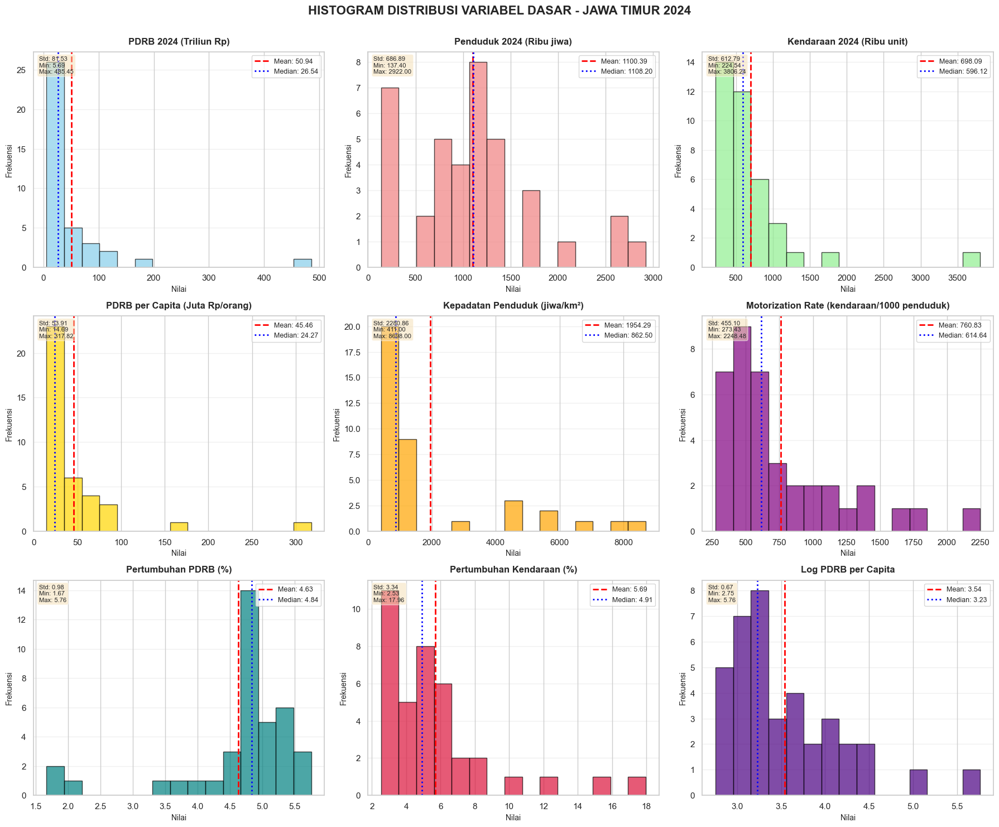

In [129]:
fig, axes = plt.subplots(3, 3, figsize=(18, 15))axes = axes.flatten()variables = [    ('PDRB_2024', 'PDRB 2024 (Triliun Rp)', 'skyblue'),    ('Pop_2024_ribu', 'Penduduk 2024 (Ribu jiwa)', 'lightcoral'),    ('Veh_2024', 'Kendaraan 2024 (Ribu unit)', 'lightgreen'),    ('PDRB_per_Capita', 'PDRB per Capita (Juta Rp/orang)', 'gold'),    ('Kepadatan_Penduduk', 'Kepadatan Penduduk (jiwa/km²)', 'orange'),    ('Motorization_Rate', 'Motorization Rate (kendaraan/1000 penduduk)', 'purple'),    ('PDRB_Growth_%', 'Pertumbuhan PDRB (%)', 'teal'),    ('Veh_Growth_%', 'Pertumbuhan Kendaraan (%)', 'crimson'),    ('Log_PDRB_per_Capita', 'Log PDRB per Capita', 'indigo')]print("="*80)print("📊 HISTOGRAM DISTRIBUSI VARIABEL UTAMA")print("="*80)for idx, (var, title, color) in enumerate(variables):    ax = axes[idx]        data = df[var]        n, bins, patches = ax.hist(data, bins=15, color=color, alpha=0.7, edgecolor='black')        mean_val = data.mean()    median_val = data.median()        ax.axvline(mean_val, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_val:.2f}')    ax.axvline(median_val, color='blue', linestyle=':', linewidth=2, label=f'Median: {median_val:.2f}')        ax.set_title(title, fontsize=12, fontweight='bold', pad=10)    ax.set_xlabel('Nilai', fontsize=10)    ax.set_ylabel('Frekuensi', fontsize=10)    ax.legend(loc='upper right', fontsize=9)    ax.grid(True, alpha=0.3, axis='y')        std_val = data.std()    min_val = data.min()    max_val = data.max()        stats_text = f'Std: {std_val:.2f}\nMin: {min_val:.2f}\nMax: {max_val:.2f}'    ax.text(0.02, 0.98, stats_text, transform=ax.transAxes,             fontsize=8, verticalalignment='top',            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))        print(f"\n{idx+1}. {title}")    print(f"   Mean: {mean_val:.2f} | Median: {median_val:.2f} | Std: {std_val:.2f}")    print(f"   Min: {min_val:.2f} | Max: {max_val:.2f}")plt.suptitle('HISTOGRAM DISTRIBUSI VARIABEL DASAR - JAWA TIMUR 2024',              fontsize=16, fontweight='bold', y=0.995)plt.tight_layout(rect=[0, 0.01, 1, 0.99])hist_path = DATA_PATH + 'histogram_distribusi_variabel_dasar.png'plt.savefig(hist_path, dpi=300, bbox_inches='tight')print(f"\n{'='*80}")print(f"✓ Histogram disimpan: {hist_path}")print(f"\n💡 Histogram untuk Economic Score, Mobility Score, Transport Efficiency,")print(f"   dan Elasticity akan ditampilkan setelah clustering.")print("="*80)plt.show()\n


📊 KLASIFIKASI HIERARKI RTRW - 2 CLUSTER (PKN & PKW)

   REVISI METODOLOGI:
   1. Economic Score = Skala Ekonomi (60%) + Intensitas (40%)
      - Skala: PDRB Total (35%) + Populasi (25%)
      - Intensitas: PDRB per Kapita (20%) + Kepadatan Penduduk (20%)

   2. Mobility Score = Kendaraan (60%) + Efisiensi (40%)
      - Skala: Jumlah Kendaraan (60%)
      - Efisiensi: Transport Efficiency / PDRB per Kendaraan (40%)

   3. K-Means Clustering pada 2 dimensi: Economic & Mobility


📊 ECONOMIC SCORE - Komponen:
------------------------------------------------------------
   Skala Ekonomi (60%):
      • PDRB Total (35%)      : max = 485.45 T (Surabaya)
      • Populasi (25%)        : max = 2922 Ribu jiwa
   Intensitas (40%):
      • PDRB per Kapita (20%) : max = 317.82 Juta/org
      • Kepadatan (20%)       : max = 8698 jiwa/km²

📊 MOBILITY SCORE - Komponen:
------------------------------------------------------------
   Skala Kendaraan (60%):
      • Total Kendaraan       : max = 3806 Ribu u

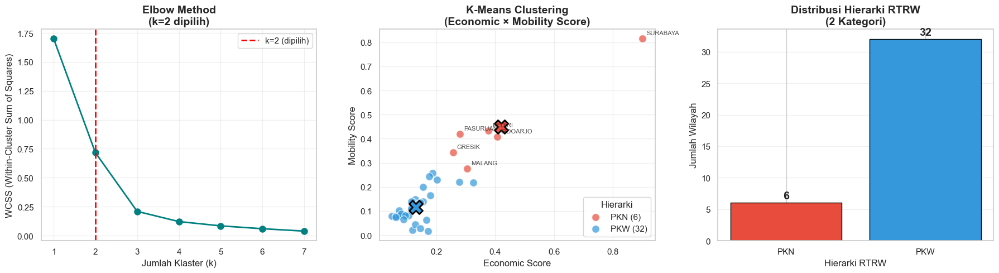


📝 CATATAN METODOLOGI (REVISI):

   PERUBAHAN UTAMA:
   1. Economic Score sekarang menyertakan KEPADATAN PENDUDUK
      → Wilayah padat (urban) mendapat skor lebih tinggi

   2. Mobility Score sebagai dimensi baru untuk K-Means
      → Mengukur peran wilayah sebagai pusat mobilitas/logistik
      → Data kendaraan tidak sia-sia, digunakan secara bermakna

   3. K-Means menggunakan 2 dimensi (Economic × Mobility)
      → Klasifikasi lebih akurat dengan mempertimbangkan:
        • Kekuatan ekonomi (PDRB, Populasi, Intensitas)
        • Peran sebagai hub transportasi (Kendaraan, Efisiensi)



### 📊 HISTOGRAM DISTRIBUSI VARIABEL CLUSTERING & PERBANDINGAN HIERARKI

📊 HISTOGRAM DISTRIBUSI VARIABEL CLUSTERING

1. Economic Score (0-1)
   Mean: 0.177 | Median: 0.131 | Std: 0.150
   Min: 0.050 | Max: 0.900

2. Mobility Score (0-1)
   Mean: 0.169 | Median: 0.121 | Std: 0.153
   Min: 0.017 | Max: 0.815

3. Transport Efficiency (PDRB/Kendaraan)
   Mean: 0.063 | Median: 0.050 | Std: 0.047
   Min: 0.016 | Max: 0.223

4. Elasticity (Arc Method)
   Mean: 1.362 | Median: 1.020 | Std: 1.008
   Min: 0.498 | Max: 4.843

✓ Histogram clustering variables disimpan: /Users/muhammadrizalhafiyyan/Documents/kendaraan pdrb ah enak/histogram_clustering_variables.png


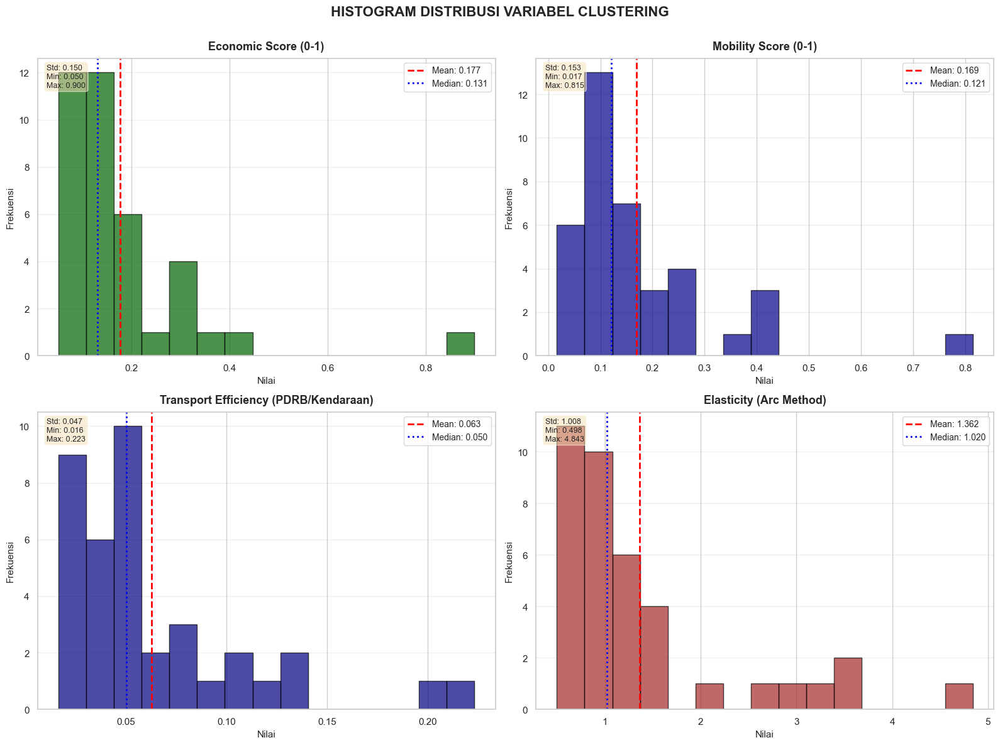

In [131]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))axes = axes.flatten()clustering_vars = [    ('Economic_Score', 'Economic Score (0-1)', 'darkgreen'),    ('Mobility_Score', 'Mobility Score (0-1)', 'darkblue'),    ('Transport_Efficiency', 'Transport Efficiency (PDRB/Kendaraan)', 'navy'),    ('Elasticity', 'Elasticity (Arc Method)', 'brown')]print("="*80)print("📊 HISTOGRAM DISTRIBUSI VARIABEL CLUSTERING")print("="*80)for idx, (var, title, color) in enumerate(clustering_vars):    ax = axes[idx]        if var == 'Elasticity':        data = df[(df[var] > -5) & (df[var] < 10)][var]    else:        data = df[var]        n, bins, patches = ax.hist(data, bins=15, color=color, alpha=0.7, edgecolor='black')        mean_val = data.mean()    median_val = data.median()        ax.axvline(mean_val, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_val:.3f}')    ax.axvline(median_val, color='blue', linestyle=':', linewidth=2, label=f'Median: {median_val:.3f}')        ax.set_title(title, fontsize=13, fontweight='bold', pad=10)    ax.set_xlabel('Nilai', fontsize=11)    ax.set_ylabel('Frekuensi', fontsize=11)    ax.legend(loc='upper right', fontsize=10)    ax.grid(True, alpha=0.3, axis='y')        std_val = data.std()    min_val = data.min()    max_val = data.max()        stats_text = f'Std: {std_val:.3f}\nMin: {min_val:.3f}\nMax: {max_val:.3f}'    ax.text(0.02, 0.98, stats_text, transform=ax.transAxes,             fontsize=9, verticalalignment='top',            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))        print(f"\n{idx+1}. {title}")    print(f"   Mean: {mean_val:.3f} | Median: {median_val:.3f} | Std: {std_val:.3f}")    print(f"   Min: {min_val:.3f} | Max: {max_val:.3f}")plt.suptitle('HISTOGRAM DISTRIBUSI VARIABEL CLUSTERING',              fontsize=16, fontweight='bold', y=0.995)plt.tight_layout(rect=[0, 0.01, 1, 0.99])hist_clustering_path = DATA_PATH + 'histogram_clustering_variables.png'plt.savefig(hist_clustering_path, dpi=300, bbox_inches='tight')print(f"\n{'='*80}")print(f"✓ Histogram clustering variables disimpan: {hist_clustering_path}")print("="*80)plt.show()\n


📊 HISTOGRAM DISTRIBUSI PER HIERARKI RTRW (PKN vs PKW)

1. Economic Score:
   PKN: Mean=0.42, Median=0.34, Std=0.24
   PKW: Mean=0.13, Median=0.12, Std=0.06

2. Mobility Score:
   PKN: Mean=0.45, Median=0.41, Std=0.19
   PKW: Mean=0.12, Median=0.10, Std=0.07

3. PDRB per Capita:
   PKN: Mean=125.75, Median=82.84, Std=104.01
   PKW: Mean=30.41, Median=23.35, Std=15.58

4. Pertumbuhan PDRB:
   PKN: Mean=4.97, Median=5.15, Std=0.83
   PKW: Mean=4.57, Median=4.82, Std=1.00

5. Pertumbuhan Kendaraan:
   PKN: Mean=4.56, Median=4.84, Std=1.13
   PKW: Mean=5.90, Median=5.05, Std=3.58

6. Motorization Rate:
   PKN: Mean=838.87, Median=703.80, Std=428.34
   PKW: Mean=746.20, Median=573.50, Std=464.99

✓ Histogram PKN vs PKW disimpan: /Users/muhammadrizalhafiyyan/Documents/kendaraan pdrb ah enak/histogram_distribusi_pkn_pkw.png


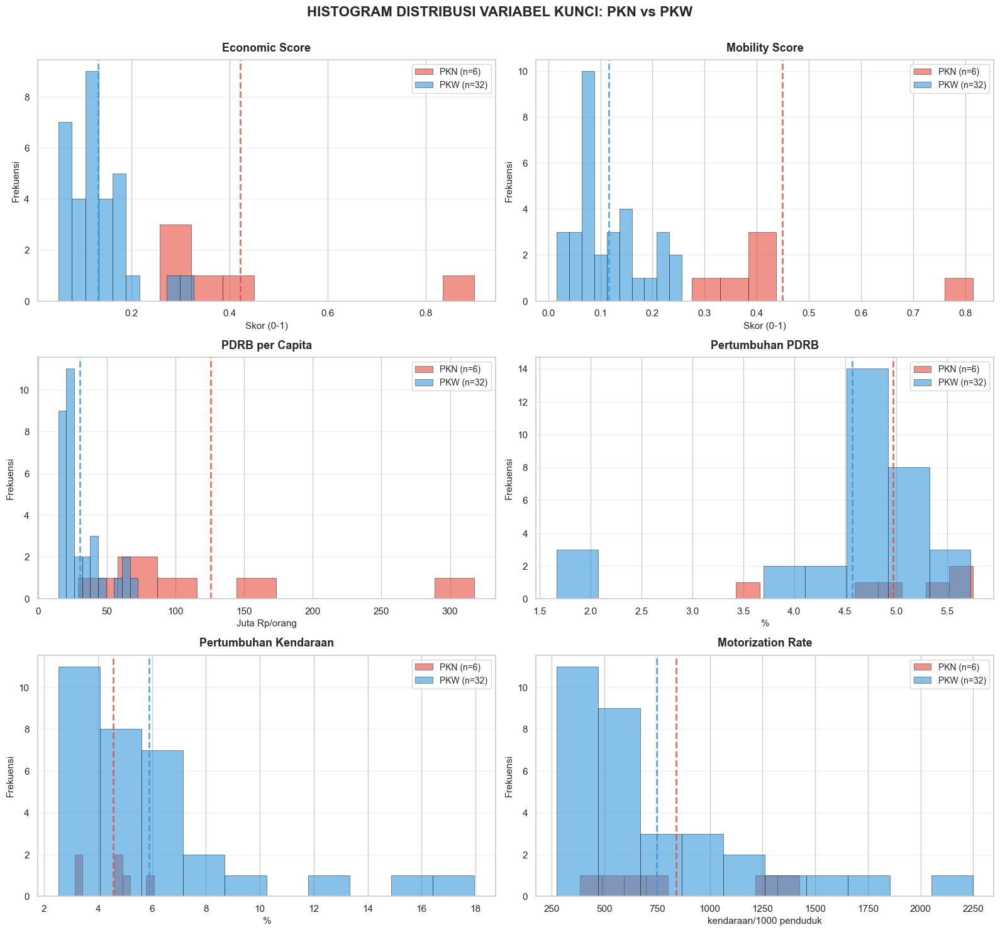

In [132]:
fig, axes = plt.subplots(3, 2, figsize=(16, 15))axes = axes.flatten()key_variables = [    ('Economic_Score', 'Economic Score', 'Skor (0-1)'),    ('Mobility_Score', 'Mobility Score', 'Skor (0-1)'),    ('PDRB_per_Capita', 'PDRB per Capita', 'Juta Rp/orang'),    ('PDRB_Growth_%', 'Pertumbuhan PDRB', '%'),    ('Veh_Growth_%', 'Pertumbuhan Kendaraan', '%'),    ('Motorization_Rate', 'Motorization Rate', 'kendaraan/1000 penduduk')]colors = {'PKN': 'print("="*80)print("📊 HISTOGRAM DISTRIBUSI PER HIERARKI RTRW (PKN vs PKW)")print("="*80)for idx, (var, title, unit) in enumerate(key_variables):    ax = axes[idx]        for hierarki in ['PKN', 'PKW']:        data = df[df['Hierarki_RTRW'] == hierarki][var]                ax.hist(data, bins=10, color=colors[hierarki], alpha=0.6,                 label=f'{hierarki} (n={len(data)})', edgecolor='black', linewidth=0.5)                mean_val = data.mean()        ax.axvline(mean_val, color=colors[hierarki], linestyle='--',                    linewidth=2, alpha=0.8)        ax.set_title(f'{title}', fontsize=13, fontweight='bold', pad=10)    ax.set_xlabel(f'{unit}', fontsize=11)    ax.set_ylabel('Frekuensi', fontsize=11)    ax.legend(loc='upper right', fontsize=10)    ax.grid(True, alpha=0.3, axis='y')        print(f"\n{idx+1}. {title}:")    for hierarki in ['PKN', 'PKW']:        data = df[df['Hierarki_RTRW'] == hierarki][var]        print(f"   {hierarki}: Mean={data.mean():.2f}, Median={data.median():.2f}, "              f"Std={data.std():.2f}")plt.suptitle('HISTOGRAM DISTRIBUSI VARIABEL KUNCI: PKN vs PKW',              fontsize=16, fontweight='bold', y=0.995)plt.tight_layout(rect=[0, 0.01, 1, 0.99])hist_hierarki_path = DATA_PATH + 'histogram_distribusi_pkn_pkw.png'plt.savefig(hist_hierarki_path, dpi=300, bbox_inches='tight')print(f"\n{'='*80}")print(f"✓ Histogram PKN vs PKW disimpan: {hist_hierarki_path}")print("="*80)plt.show()\n


### 🔥 HEATMAP KORELASI ANTAR VARIABEL

In [ ]:
correlation_vars = [    'PDRB_2024',    'Pop_2024_ribu',     'Veh_2024',    'PDRB_per_Capita',    'Kepadatan_Penduduk',    'Motorization_Rate',    'PDRB_Growth_%',    'Veh_Growth_%',    'Log_PDRB_per_Capita',    'Economic_Score',    'Mobility_Score',    'Transport_Efficiency']corr_matrix = df[correlation_vars].corr()fig, ax = plt.subplots(figsize=(14, 12))sns.heatmap(corr_matrix,             annot=True,            fmt='.2f',            cmap='coolwarm',            center=0,            square=True,            linewidths=0.5,            cbar_kws={"shrink": 0.8, "label": "Koefisien Korelasi"},            vmin=-1, vmax=1,            ax=ax)plt.title('HEATMAP KORELASI ANTAR VARIABEL EKONOMI DAN MOBILITAS\nProvinsi Jawa Timur',           fontsize=16, fontweight='bold', pad=20)plt.xticks(rotation=45, ha='right', fontsize=10)plt.yticks(rotation=0, fontsize=10)plt.tight_layout()heatmap_path = DATA_PATH + 'heatmap_korelasi_variabel.png'plt.savefig(heatmap_path, dpi=300, bbox_inches='tight')print("="*80)print("🔥 HEATMAP KORELASI ANTAR VARIABEL")print("="*80)print(f"✓ Heatmap korelasi disimpan: {heatmap_path}")print("\n📊 KORELASI KUAT (|r| > 0.7):")print("-"*80)strong_corr = []for i in range(len(corr_matrix.columns)):    for j in range(i+1, len(corr_matrix.columns)):        corr_val = corr_matrix.iloc[i, j]        if abs(corr_val) > 0.7:            var1 = corr_matrix.columns[i]            var2 = corr_matrix.columns[j]            strong_corr.append((var1, var2, corr_val))strong_corr.sort(key=lambda x: abs(x[2]), reverse=True)for idx, (var1, var2, corr_val) in enumerate(strong_corr, 1):    direction = "Positif 📈" if corr_val > 0 else "Negatif 📉"    print(f"{idx:2d}. {var1:25s} ↔ {var2:25s}: {corr_val:+.3f} ({direction})")print("="*80)plt.show()\n


📊 VALIDASI K-MEANS CLUSTERING

Silhouette Score untuk berbagai k:
  k=2: Silhouette Score = 0.6629 ◀ DIPILIH (terbaik)
  k=3: Silhouette Score = 0.6246
  k=4: Silhouette Score = 0.5556
  k=5: Silhouette Score = 0.4347

📊 DISTRIBUSI ECONOMIC SCORE per HIERARKI RTRW

Statistik Economic Score per Hierarki:
               count   mean    min    max
Hierarki_RTRW                            
PKN                6  0.421  0.257  0.900
PKW               32  0.131  0.050  0.326


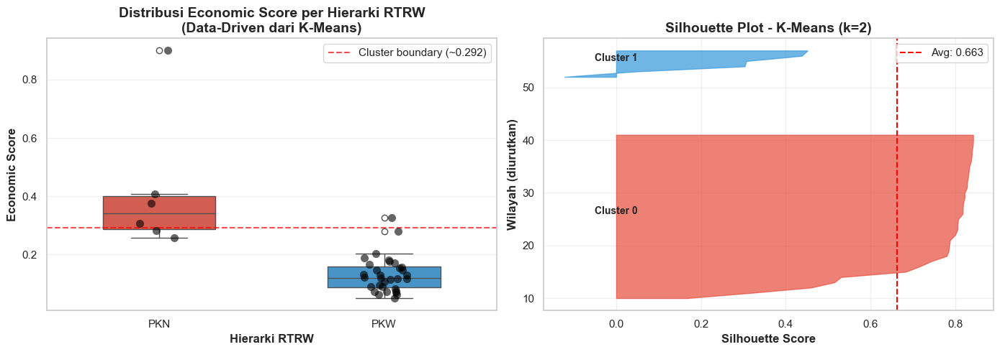

In [133]:
from sklearn.metrics import silhouette_score, silhouette_samplesprint("="*70)print("📊 VALIDASI K-MEANS CLUSTERING")print("="*70)print("\nSilhouette Score untuk berbagai k:")for k in range(2, 6):    model = KMeans(n_clusters=k, random_state=42, n_init=10)    labels = model.fit_predict(X_final)    score = silhouette_score(X_final, labels)    marker = " ◀ DIPILIH (terbaik)" if k == 2 else ""    print(f"  k={k}: Silhouette Score = {score:.4f}{marker}")silhouette_vals = silhouette_samples(X_final, df['Cluster'])df['Silhouette'] = silhouette_valsprint("\n" + "="*70)print("📊 DISTRIBUSI ECONOMIC SCORE per HIERARKI RTRW")print("="*70)print("\nStatistik Economic Score per Hierarki:")print(df.groupby('Hierarki_RTRW')['Economic_Score'].agg(['count', 'mean', 'min', 'max']).round(3))fig, axes = plt.subplots(1, 2, figsize=(14, 5))colors = {'PKN': 'order = ['PKN', 'PKW']sns.boxplot(data=df, x='Hierarki_RTRW', y='Economic_Score', order=order,             palette=colors, ax=axes[0], width=0.5)sns.stripplot(data=df, x='Hierarki_RTRW', y='Economic_Score', order=order,              color='black', alpha=0.6, ax=axes[0], size=8)pkn_min = df[df['Hierarki_RTRW'] == 'PKN']['Economic_Score'].min()pkw_max = df[df['Hierarki_RTRW'] == 'PKW']['Economic_Score'].max()cluster_boundary = (pkn_min + pkw_max) / 2axes[0].axhline(y=cluster_boundary, color='red', linestyle='--', alpha=0.7,                label=f'Cluster boundary (~{cluster_boundary:.3f})')axes[0].set_xlabel('Hierarki RTRW', fontsize=12, fontweight='bold')axes[0].set_ylabel('Economic Score', fontsize=12, fontweight='bold')axes[0].set_title('Distribusi Economic Score per Hierarki RTRW\n(Data-Driven dari K-Means)', fontsize=14, fontweight='bold')axes[0].legend(loc='upper right')axes[0].grid(axis='y', alpha=0.3)y_lower = 10for cluster in sorted(df['Cluster'].unique()):    cluster_silhouette = df[df['Cluster'] == cluster]['Silhouette'].sort_values()    size = len(cluster_silhouette)    y_upper = y_lower + size    color = ['    axes[1].fill_betweenx(np.arange(y_lower, y_upper), 0, cluster_silhouette,                         facecolor=color, edgecolor=color, alpha=0.7)    axes[1].text(-0.05, y_lower + 0.5 * size, f'Cluster {cluster}', fontsize=10, fontweight='bold')    y_lower = y_upper + 10axes[1].axvline(x=silhouette_score(X_final, df['Cluster']), color='red', linestyle='--',                label=f'Avg: {silhouette_score(X_final, df["Cluster"]):.3f}')axes[1].set_xlabel('Silhouette Score', fontsize=12, fontweight='bold')axes[1].set_ylabel('Wilayah (diurutkan)', fontsize=12, fontweight='bold')axes[1].set_title('Silhouette Plot - K-Means (k=2)', fontsize=14, fontweight='bold')axes[1].legend(loc='upper right')axes[1].grid(True, alpha=0.3)plt.tight_layout()plt.show()\n


In [134]:
print("="*90)print("📊 PROFIL HIERARKI RTRW JAWA TIMUR (2 Kategori)")print("   PKN (Pusat Kegiatan Nasional) & PKW (Pusat Kegiatan Wilayah)")print("="*90)summary_rtrw = df.groupby('Hierarki_RTRW').agg({    'City': 'count',    'PDRB_2024': ['sum', 'mean'],    'Veh_2024': ['sum', 'mean'],    'Pop_2024_ribu': ['sum', 'mean'],    'PDRB_Growth_%': 'mean',    'Veh_Growth_%': 'mean',    'Motorization_Rate': 'mean',    'Transport_Efficiency': 'mean',    'PDRB_per_Capita': 'mean',    'Economic_Score': 'mean',    'Elasticity': ['mean', 'median']}).round(2)summary_rtrw.columns = ['Jml_Wilayah', 'Total_PDRB', 'Rata2_PDRB',                         'Total_Veh', 'Rata2_Veh',                        'Total_Pop', 'Rata2_Pop',                        'Rata2_PDRB_Growth', 'Rata2_Veh_Growth',                        'Rata2_Motorization', 'Rata2_Trans_Eff',                        'Rata2_PDRB_per_Capita', 'Rata2_Eco_Score',                        'Mean_Elasticity', 'Median_Elasticity']summary_rtrw = summary_rtrw.reindex(['PKN', 'PKW'])interpretasi = {    'PKN': 'Pusat Kegiatan NASIONAL - Pusat ekonomi utama provinsi,\n'           '        konektivitas nasional, PDRB & produktivitas tertinggi',    'PKW': 'Pusat Kegiatan WILAYAH - Penghubung antar kabupaten/kota,\n'           '        ekonomi regional, berpotensi berkembang'}for hierarki in ['PKN', 'PKW']:    data = summary_rtrw.loc[hierarki]    print(f"\n{'='*70}")    print(f"📍 {hierarki} - {interpretasi[hierarki]}")    print(f"{'='*70}")    print(f"   Jumlah Wilayah        : {int(data['Jml_Wilayah'])} Kab/Kota")    print(f"   Total PDRB            : {data['Total_PDRB']:,.2f} Ribu Miliar (Triliun Rp)")    print(f"   Rata-rata PDRB        : {data['Rata2_PDRB']:,.2f} Ribu Miliar")    print(f"   PDRB per Capita       : Rp {data['Rata2_PDRB_per_Capita']:,.2f} Juta/orang")    print(f"   Economic Score        : {data['Rata2_Eco_Score']:.3f}")    print(f"   Transport Efficiency  : {data['Rata2_Trans_Eff']:.3f} (PDRB/Kendaraan)")    print(f"   Motorization Rate     : {data['Rata2_Motorization']:,.0f} kendaraan/1000 penduduk")    print(f"   Pertumbuhan PDRB      : {data['Rata2_PDRB_Growth']:.2f}%")    print(f"   Pertumbuhan Kendaraan : {data['Rata2_Veh_Growth']:.2f}%")    print(f"   Elasticity (Mean)     : {data['Mean_Elasticity']:.2f}")    print(f"   Elasticity (Median)   : {data['Median_Elasticity']:.2f}  ◀ Lebih robust")print("\n" + "="*70)print("📊 INTERPRETASI ELASTICITY")print("="*70)print()print("\n")summary_rtrw\n


📊 PROFIL HIERARKI RTRW JAWA TIMUR (2 Kategori)
   PKN (Pusat Kegiatan Nasional) & PKW (Pusat Kegiatan Wilayah)

📍 PKN - Pusat Kegiatan NASIONAL - Pusat ekonomi utama provinsi,
        konektivitas nasional, PDRB & produktivitas tertinggi
   Jumlah Wilayah        : 6 Kab/Kota
   Total PDRB            : 1,074.49 Ribu Miliar (Triliun Rp)
   Rata-rata PDRB        : 179.08 Ribu Miliar
   PDRB per Capita       : Rp 125.75 Juta/orang
   Economic Score        : 0.420
   Transport Efficiency  : 0.140 (PDRB/Kendaraan)
   Motorization Rate     : 839 kendaraan/1000 penduduk
   Pertumbuhan PDRB      : 4.97%
   Pertumbuhan Kendaraan : 4.56%
   Elasticity (Mean)     : 0.93
   Elasticity (Median)   : 0.91  ◀ Lebih robust

📍 PKW - Pusat Kegiatan WILAYAH - Penghubung antar kabupaten/kota,
        ekonomi regional, berpotensi berkembang
   Jumlah Wilayah        : 32 Kab/Kota
   Total PDRB            : 861.41 Ribu Miliar (Triliun Rp)
   Rata-rata PDRB        : 26.92 Ribu Miliar
   PDRB per Capita       : 

,Jml_Wilayah,Total_PDRB,Rata2_PDRB,Total_Veh,Rata2_Veh,Total_Pop,Rata2_Pop,Rata2_PDRB_Growth,Rata2_Veh_Growth,Rata2_Motorization,Rata2_Trans_Eff,Rata2_PDRB_per_Capita,Rata2_Eco_Score,Mean_Elasticity,Median_Elasticity
Hierarki_RTRW,,,,,,,,,,,,,,,
PKN,6,1074.49,179.08,8830.52,1471.75,11148.9,1858.15,4.97,4.56,838.87,0.14,125.75,0.42,0.93,0.91
PKW,32,861.41,26.92,17696.74,553.02,30665.8,958.31,4.57,5.90,746.20,0.05,30.41,0.13,1.44,1.06


In [135]:
print("="*70)print("DAFTAR WILAYAH PER HIERARKI RTRW:")print("="*70)for hierarki in ['PKN', 'PKW', 'PKL']:    cities = df[df['Hierarki_RTRW'] == hierarki]['City'].tolist()    print(f"\n{'='*50}")    print(f"📍 {hierarki} - Pusat Kegiatan {'Nasional' if hierarki=='PKN' else 'Wilayah' if hierarki=='PKW' else 'Lokal'}")    print(f"   ({len(cities)} wilayah)")    print(f"{'='*50}")    for i, city in enumerate(sorted(cities), 1):        print(f"   {i:2d}. {city}")\n


DAFTAR WILAYAH PER HIERARKI RTRW:

📍 PKN - Pusat Kegiatan Nasional
   (6 wilayah)
    1. GRESIK
    2. KOTA KEDIRI
    3. KOTA SURABAYA
    4. MALANG
    5. PASURUAN
    6. SIDOARJO

📍 PKW - Pusat Kegiatan Wilayah
   (32 wilayah)
    1. BANGKALAN
    2. BANYUWANGI
    3. BLITAR
    4. BOJONEGORO
    5. BONDOWOSO
    6. JEMBER
    7. JOMBANG
    8. KEDIRI
    9. KOTA BATU
   10. KOTA BLITAR
   11. KOTA MADIUN
   12. KOTA MALANG
   13. KOTA MOJOKERTO
   14. KOTA PASURUAN
   15. KOTA PROBOLINGGO
   16. LAMONGAN
   17. LUMAJANG
   18. MADIUN
   19. MAGETAN
   20. MOJOKERTO
   21. NGANJUK
   22. NGAWI
   23. PACITAN
   24. PAMEKASAN
   25. PONOROGO
   26. PROBOLINGGO
   27. SAMPANG
   28. SITUBONDO
   29. SUMENEP
   30. TRENGGALEK
   31. TUBAN
   32. TULUNGAGUNG

📍 PKL - Pusat Kegiatan Lokal
   (0 wilayah)


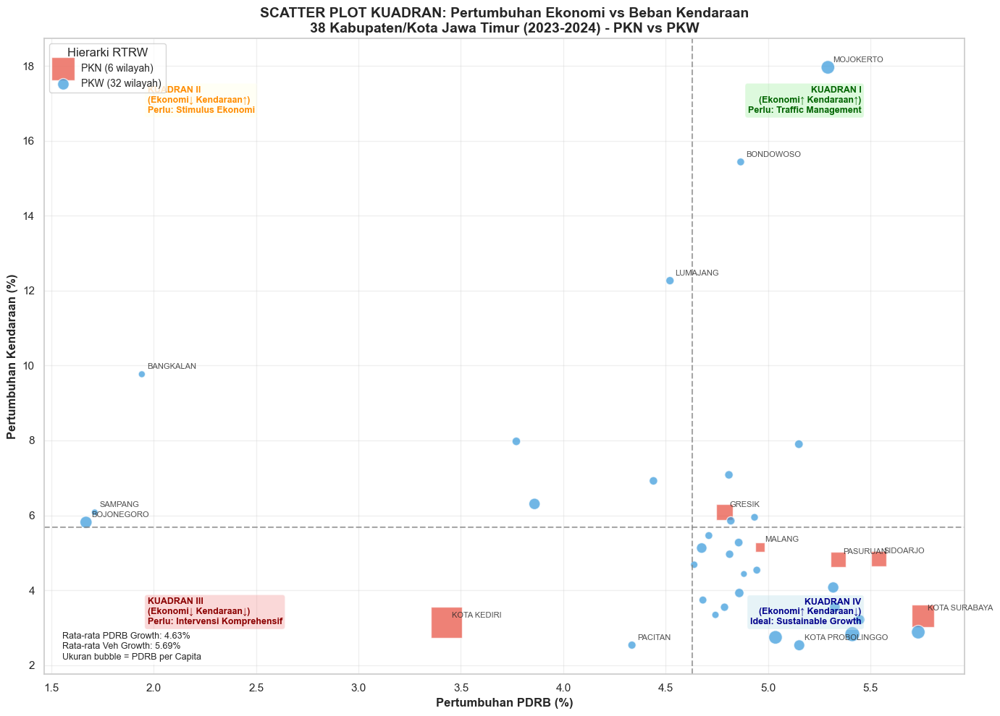

In [136]:
fig, ax = plt.subplots(figsize=(14, 10))colors = {'PKN': 'markers = {'PKN': 's', 'PKW': 'o'}for hierarki in ['PKN', 'PKW']:    data = df[df['Hierarki_RTRW'] == hierarki]    ax.scatter(data['PDRB_Growth_%'], data['Veh_Growth_%'],               c=colors[hierarki], marker=markers[hierarki],               s=data['PDRB_per_Capita']*3, alpha=0.7,                label=f'{hierarki} ({len(data)} wilayah)', edgecolors='white', linewidth=1)mean_pdrb_growth = df['PDRB_Growth_%'].mean()mean_veh_growth = df['Veh_Growth_%'].mean()ax.axvline(x=mean_pdrb_growth, color='gray', linestyle='--', linewidth=1.5, alpha=0.7)ax.axhline(y=mean_veh_growth, color='gray', linestyle='--', linewidth=1.5, alpha=0.7)ax.text(df['PDRB_Growth_%'].max() - 0.3, df['Veh_Growth_%'].max() - 0.5,         'KUADRAN I\n(Ekonomi↑ Kendaraan↑)\nPerlu: Traffic Management',         fontsize=9, ha='right', va='top', color='darkgreen', fontweight='bold',        bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.3))ax.text(df['PDRB_Growth_%'].min() + 0.3, df['Veh_Growth_%'].max() - 0.5,        'KUADRAN II\n(Ekonomi↓ Kendaraan↑)\nPerlu: Stimulus Ekonomi',        fontsize=9, ha='left', va='top', color='darkorange', fontweight='bold',        bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.3))ax.text(df['PDRB_Growth_%'].min() + 0.3, df['Veh_Growth_%'].min() + 0.5,        'KUADRAN III\n(Ekonomi↓ Kendaraan↓)\nPerlu: Intervensi Komprehensif',        fontsize=9, ha='left', va='bottom', color='darkred', fontweight='bold',        bbox=dict(boxstyle='round', facecolor='lightcoral', alpha=0.3))ax.text(df['PDRB_Growth_%'].max() - 0.3, df['Veh_Growth_%'].min() + 0.5,        'KUADRAN IV\n(Ekonomi↑ Kendaraan↓)\nIdeal: Sustainable Growth',        fontsize=9, ha='right', va='bottom', color='darkblue', fontweight='bold',        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.3))for _, row in df.iterrows():    if row['PDRB_per_Capita'] > 100 or row['Hierarki_RTRW'] == 'PKN' or \       abs(row['PDRB_Growth_%'] - mean_pdrb_growth) > 1.5 or \       abs(row['Veh_Growth_%'] - mean_veh_growth) > 3:        ax.annotate(row['City'], (row['PDRB_Growth_%'], row['Veh_Growth_%']),                   xytext=(5, 5), textcoords='offset points', fontsize=8, alpha=0.8)ax.set_xlabel('Pertumbuhan PDRB (%)', fontsize=12, fontweight='bold')ax.set_ylabel('Pertumbuhan Kendaraan (%)', fontsize=12, fontweight='bold')ax.set_title('SCATTER PLOT KUADRAN: Pertumbuhan Ekonomi vs Beban Kendaraan\n'             '38 Kabupaten/Kota Jawa Timur (2023-2024) - PKN vs PKW',              fontsize=14, fontweight='bold')ax.legend(title='Hierarki RTRW', loc='upper left', fontsize=10)ax.grid(True, alpha=0.3)info_text = f'Rata-rata PDRB Growth: {mean_pdrb_growth:.2f}%\n'info_text += f'Rata-rata Veh Growth: {mean_veh_growth:.2f}%\n'info_text += f'Ukuran bubble = PDRB per Capita'ax.text(0.02, 0.02, info_text, transform=ax.transAxes, fontsize=9,         verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))plt.tight_layout()plt.show()\n


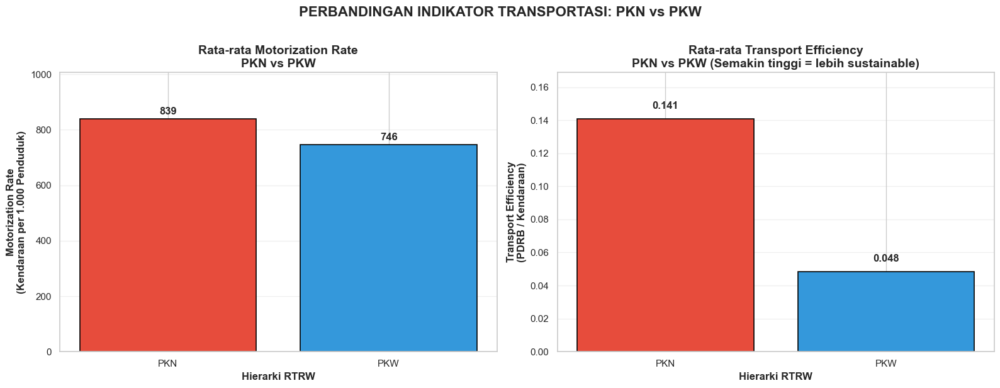

In [137]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))order = ['PKN', 'PKW']palette = {'PKN': 'motor_by_rtrw = df.groupby('Hierarki_RTRW')['Motorization_Rate'].mean().reindex(order)bars = axes[0].bar(motor_by_rtrw.index, motor_by_rtrw.values,                    color=[palette[h] for h in order], edgecolor='black', linewidth=1.2)for bar, val in zip(bars, motor_by_rtrw.values):    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 10,                f'{val:.0f}', ha='center', va='bottom', fontsize=12, fontweight='bold')axes[0].set_xlabel('Hierarki RTRW', fontsize=12, fontweight='bold')axes[0].set_ylabel('Motorization Rate\n(Kendaraan per 1.000 Penduduk)', fontsize=12, fontweight='bold')axes[0].set_title('Rata-rata Motorization Rate\nPKN vs PKW', fontsize=14, fontweight='bold')axes[0].set_ylim(0, motor_by_rtrw.max() * 1.2)axes[0].grid(axis='y', alpha=0.3)trans_eff_by_rtrw = df.groupby('Hierarki_RTRW')['Transport_Efficiency'].mean().reindex(order)bars2 = axes[1].bar(trans_eff_by_rtrw.index, trans_eff_by_rtrw.values,                    color=[palette[h] for h in order], edgecolor='black', linewidth=1.2)for bar, val in zip(bars2, trans_eff_by_rtrw.values):    axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,                f'{val:.3f}', ha='center', va='bottom', fontsize=12, fontweight='bold')axes[1].set_xlabel('Hierarki RTRW', fontsize=12, fontweight='bold')axes[1].set_ylabel('Transport Efficiency\n(PDRB / Kendaraan)', fontsize=12, fontweight='bold')axes[1].set_title('Rata-rata Transport Efficiency\nPKN vs PKW (Semakin tinggi = lebih sustainable)', fontsize=14, fontweight='bold')axes[1].set_ylim(0, trans_eff_by_rtrw.max() * 1.2)axes[1].grid(axis='y', alpha=0.3)plt.suptitle('PERBANDINGAN INDIKATOR TRANSPORTASI: PKN vs PKW',              fontsize=16, fontweight='bold', y=1.02)plt.tight_layout()plt.show()\n


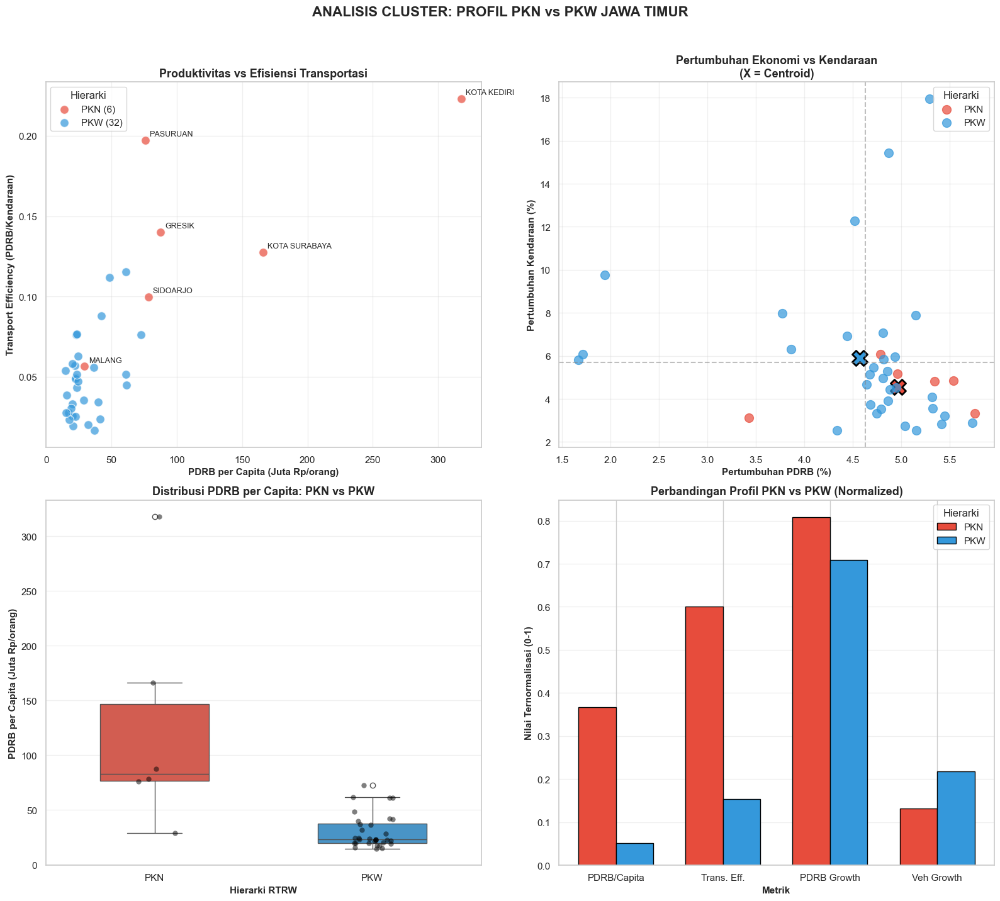

In [138]:
fig, axes = plt.subplots(2, 2, figsize=(16, 14))colors = {'PKN': 'order = ['PKN', 'PKW']ax1 = axes[0, 0]for hierarki in order:    data = df[df['Hierarki_RTRW'] == hierarki]    ax1.scatter(data['PDRB_per_Capita'], data['Transport_Efficiency'],               c=colors[hierarki], s=100, alpha=0.7,                label=f'{hierarki} ({len(data)})', edgecolors='white', linewidth=1)    for _, row in df[df['Hierarki_RTRW'] == 'PKN'].iterrows():    ax1.annotate(row['City'], (row['PDRB_per_Capita'], row['Transport_Efficiency']),               xytext=(5, 5), textcoords='offset points', fontsize=9)ax1.set_xlabel('PDRB per Capita (Juta Rp/orang)', fontsize=11, fontweight='bold')ax1.set_ylabel('Transport Efficiency (PDRB/Kendaraan)', fontsize=11, fontweight='bold')ax1.set_title('Produktivitas vs Efisiensi Transportasi', fontsize=13, fontweight='bold')ax1.legend(title='Hierarki')ax1.grid(True, alpha=0.3)ax2 = axes[0, 1]for hierarki in order:    data = df[df['Hierarki_RTRW'] == hierarki]    ax2.scatter(data['PDRB_Growth_%'], data['Veh_Growth_%'],               c=colors[hierarki], s=100, alpha=0.7, label=hierarki)    ax2.scatter(data['PDRB_Growth_%'].mean(), data['Veh_Growth_%'].mean(),               c=colors[hierarki], s=300, marker='X', edgecolors='black', linewidth=2)ax2.axvline(x=df['PDRB_Growth_%'].mean(), color='gray', linestyle='--', alpha=0.5)ax2.axhline(y=df['Veh_Growth_%'].mean(), color='gray', linestyle='--', alpha=0.5)ax2.set_xlabel('Pertumbuhan PDRB (%)', fontsize=11, fontweight='bold')ax2.set_ylabel('Pertumbuhan Kendaraan (%)', fontsize=11, fontweight='bold')ax2.set_title('Pertumbuhan Ekonomi vs Kendaraan\n(X = Centroid)', fontsize=13, fontweight='bold')ax2.legend(title='Hierarki')ax2.grid(True, alpha=0.3)ax3 = axes[1, 0]sns.boxplot(data=df, x='Hierarki_RTRW', y='PDRB_per_Capita', order=order,             palette=colors, ax=ax3, width=0.5)sns.stripplot(data=df, x='Hierarki_RTRW', y='PDRB_per_Capita', order=order,             color='black', alpha=0.5, ax=ax3, size=6)ax3.set_xlabel('Hierarki RTRW', fontsize=11, fontweight='bold')ax3.set_ylabel('PDRB per Capita (Juta Rp/orang)', fontsize=11, fontweight='bold')ax3.set_title('Distribusi PDRB per Capita: PKN vs PKW', fontsize=13, fontweight='bold')ax3.grid(axis='y', alpha=0.3)ax4 = axes[1, 1]metrics = ['PDRB_per_Capita', 'Transport_Efficiency', 'PDRB_Growth_%', 'Veh_Growth_%']metric_labels = ['PDRB/Capita', 'Trans. Eff.', 'PDRB Growth', 'Veh Growth']df_norm = df.copy()for m in metrics:    df_norm[m + '_norm'] = (df[m] - df[m].min()) / (df[m].max() - df[m].min())x = np.arange(len(metrics))width = 0.35for i, hierarki in enumerate(order):    data = df_norm[df_norm['Hierarki_RTRW'] == hierarki]    values = [data[m + '_norm'].mean() for m in metrics]    ax4.bar(x + i*width, values, width, label=hierarki, color=colors[hierarki], edgecolor='black')ax4.set_xlabel('Metrik', fontsize=11, fontweight='bold')ax4.set_ylabel('Nilai Ternormalisasi (0-1)', fontsize=11, fontweight='bold')ax4.set_title('Perbandingan Profil PKN vs PKW (Normalized)', fontsize=13, fontweight='bold')ax4.set_xticks(x + width/2)ax4.set_xticklabels(metric_labels)ax4.legend(title='Hierarki')ax4.grid(axis='y', alpha=0.3)plt.suptitle('ANALISIS CLUSTER: PROFIL PKN vs PKW JAWA TIMUR',              fontsize=16, fontweight='bold', y=1.02)plt.tight_layout()plt.show()\n


### 📊 ANALISIS TAMBAHAN: Distribusi Indikator per Hierarki RTRW

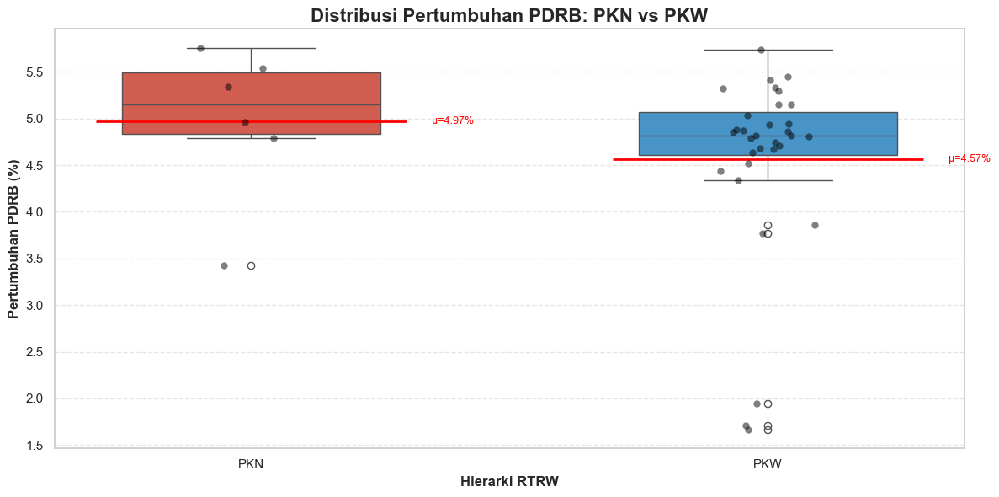

In [139]:
plt.figure(figsize=(12, 6))order = ['PKN', 'PKW']palette = {'PKN': 'sns.boxplot(x='Hierarki_RTRW', y='PDRB_Growth_%', data=df, order=order, palette=palette, width=0.5)sns.stripplot(x='Hierarki_RTRW', y='PDRB_Growth_%', data=df, order=order, color='black', alpha=0.5, size=6)plt.title('Distribusi Pertumbuhan PDRB: PKN vs PKW', fontsize=16, fontweight='bold')plt.xlabel('Hierarki RTRW', fontsize=12, fontweight='bold')plt.ylabel('Pertumbuhan PDRB (%)', fontsize=12, fontweight='bold')plt.grid(axis='y', linestyle='--', alpha=0.5)for i, h in enumerate(order):    mean_val = df[df['Hierarki_RTRW']==h]['PDRB_Growth_%'].mean()    plt.hlines(mean_val, i-0.3, i+0.3, colors='red', linewidth=2, linestyles='solid')    plt.text(i+0.35, mean_val, f'μ={mean_val:.2f}%', va='center', fontsize=9, color='red')plt.tight_layout()plt.show()\n


### 📈 Distribusi Pertumbuhan Kendaraan per Hierarki RTRW

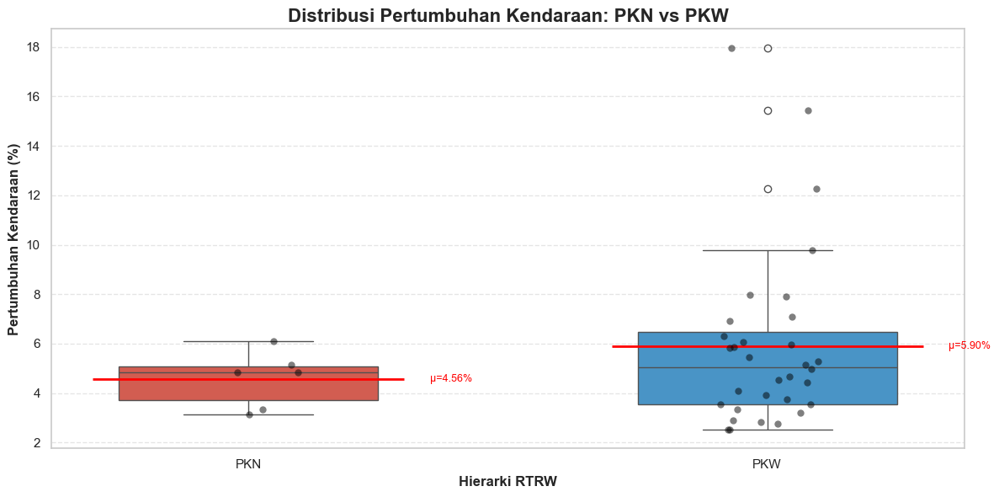

In [140]:
plt.figure(figsize=(12, 6))order = ['PKN', 'PKW']palette = {'PKN': 'sns.boxplot(x='Hierarki_RTRW', y='Veh_Growth_%', data=df, order=order, palette=palette, width=0.5)sns.stripplot(x='Hierarki_RTRW', y='Veh_Growth_%', data=df, order=order, color='black', alpha=0.5, size=6)plt.title('Distribusi Pertumbuhan Kendaraan: PKN vs PKW', fontsize=16, fontweight='bold')plt.xlabel('Hierarki RTRW', fontsize=12, fontweight='bold')plt.ylabel('Pertumbuhan Kendaraan (%)', fontsize=12, fontweight='bold')plt.grid(axis='y', linestyle='--', alpha=0.5)for i, h in enumerate(order):    mean_val = df[df['Hierarki_RTRW']==h]['Veh_Growth_%'].mean()    plt.hlines(mean_val, i-0.3, i+0.3, colors='red', linewidth=2, linestyles='solid')    plt.text(i+0.35, mean_val, f'μ={mean_val:.2f}%', va='center', fontsize=9, color='red')plt.tight_layout()plt.show()\n


### 💰 Distribusi PDRB per Capita dan Elasticity per Hierarki RTRW

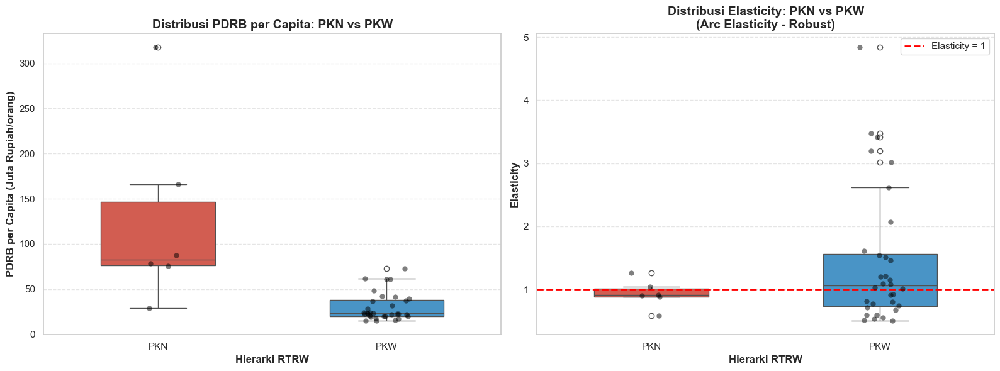


INTERPRETASI ELASTICITY:
• Elasticity > 1: Pertumbuhan kendaraan LEBIH CEPAT dari ekonomi
• Elasticity = 1: Pertumbuhan kendaraan SEBANDING dengan ekonomi
• Elasticity < 1: Pertumbuhan kendaraan LEBIH LAMBAT dari ekonomi


In [141]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))order = ['PKN', 'PKW']palette = {'PKN': 'sns.boxplot(x='Hierarki_RTRW', y='PDRB_per_Capita', data=df, order=order, palette=palette, ax=axes[0], width=0.5)sns.stripplot(x='Hierarki_RTRW', y='PDRB_per_Capita', data=df, order=order, color='black', alpha=0.5, ax=axes[0], size=6)axes[0].set_title('Distribusi PDRB per Capita: PKN vs PKW', fontsize=14, fontweight='bold')axes[0].set_xlabel('Hierarki RTRW', fontsize=12, fontweight='bold')axes[0].set_ylabel('PDRB per Capita (Juta Rupiah/orang)', fontsize=12, fontweight='bold')axes[0].grid(axis='y', linestyle='--', alpha=0.5)df_filtered = df[(df['Elasticity'] > -5) & (df['Elasticity'] < 10)]sns.boxplot(x='Hierarki_RTRW', y='Elasticity', data=df_filtered, order=order, palette=palette, ax=axes[1], width=0.5)sns.stripplot(x='Hierarki_RTRW', y='Elasticity', data=df_filtered, order=order, color='black', alpha=0.5, ax=axes[1], size=6)axes[1].axhline(y=1, color='red', linestyle='--', linewidth=2, label='Elasticity = 1')axes[1].set_title('Distribusi Elasticity: PKN vs PKW\n(Arc Elasticity - Robust)', fontsize=14, fontweight='bold')axes[1].set_xlabel('Hierarki RTRW', fontsize=12, fontweight='bold')axes[1].set_ylabel('Elasticity', fontsize=12, fontweight='bold')axes[1].grid(axis='y', linestyle='--', alpha=0.5)axes[1].legend()plt.tight_layout()plt.show()print("\n" + "="*70)print("INTERPRETASI ELASTICITY:")print("="*70)print("• Elasticity > 1: Pertumbuhan kendaraan LEBIH CEPAT dari ekonomi")print("• Elasticity = 1: Pertumbuhan kendaraan SEBANDING dengan ekonomi")print("• Elasticity < 1: Pertumbuhan kendaraan LEBIH LAMBAT dari ekonomi")print("="*70)\n


In [142]:
display_cols = ['City', 'Jenis_Wilayah', 'Hierarki_RTRW', 'Cluster',                'PDRB_2024', 'Veh_2024', 'Pop_2024_ribu', 'Kepadatan_Penduduk',                'PDRB_per_Capita', 'Economic_Score', 'Mobility_Score',                'PDRB_Growth_%', 'Veh_Growth_%', 'Elasticity']df_display = df[display_cols].copy()df_display = df_display.rename(columns={    'PDRB_2024': 'PDRB (Triliun)',    'Veh_2024': 'Kendaraan (Ribu)',    'Pop_2024_ribu': 'Penduduk (Ribu)',    'Kepadatan_Penduduk': 'Kepadatan',    'PDRB_per_Capita': 'PDRB/Kapita (Juta)',    'Economic_Score': 'Eco Score',    'Mobility_Score': 'Mob Score',    'PDRB_Growth_%': 'PDRB Growth (%)',    'Veh_Growth_%': 'Veh Growth (%)'})df_display['Hierarki_Order'] = df_display['Hierarki_RTRW'].map({'PKN': 1, 'PKW': 2})df_display = df_display.sort_values(['Hierarki_Order', 'Eco Score'], ascending=[True, False])df_display = df_display.drop('Hierarki_Order', axis=1).reset_index(drop=True)df_display.index = df_display.index + 1print("="*120)print("TABEL DATA LENGKAP 38 KABUPATEN/KOTA JAWA TIMUR")print("Klasifikasi: PKN & PKW - K-Means pada Economic Score + Mobility Score")print("="*120)print("📊 SATUAN: PDRB (Triliun Rp) | Kendaraan (Ribu unit) | Penduduk (Ribu jiwa) | Kepadatan (jiwa/km²)")print("="*120)df_display.round(2)\n


TABEL DATA LENGKAP 38 KABUPATEN/KOTA JAWA TIMUR
Klasifikasi: PKN & PKW - K-Means pada Economic Score + Mobility Score
📊 SATUAN: PDRB (Triliun Rp) | Kendaraan (Ribu unit) | Penduduk (Ribu jiwa) | Kepadatan (jiwa/km²)


,City,Jenis_Wilayah,Hierarki_RTRW,Cluster,PDRB (Triliun),Kendaraan (Ribu),Penduduk (Ribu),Kepadatan,PDRB/Kapita (Juta),Eco Score,Mob Score,PDRB Growth (%),Veh Growth (%),Elasticity
1,KOTA SURABAYA,KOTA,PKN,1,485.45,3806.24,2922.0,8698.0,166.14,0.90,0.81,5.76,3.32,0.58
2,SIDOARJO,KABUPATEN,PKN,1,169.87,1702.21,2171.5,2999.0,78.23,0.41,0.41,5.54,4.85,0.88
3,KOTA KEDIRI,KOTA,PKN,1,94.77,424.45,298.2,4436.0,317.82,0.38,0.43,3.43,3.14,0.92
4,MALANG,KABUPATEN,PKN,1,79.50,1410.12,2736.0,788.0,29.06,0.31,0.28,4.96,5.16,1.04
5,PASURUAN,KABUPATEN,PKN,1,125.62,636.74,1657.2,1110.0,75.80,0.28,0.42,5.34,4.82,0.91
6,GRESIK,KABUPATEN,PKN,1,119.27,850.76,1364.0,1086.0,87.44,0.26,0.34,4.79,6.08,1.26
7,KOTA MALANG,KOTA,PKW,0,63.37,833.88,872.7,7857.0,72.62,0.33,0.22,5.41,2.83,0.53
8,JEMBER,KABUPATEN,PKW,0,62.90,1001.50,2603.8,786.0,24.16,0.28,0.22,4.86,5.27,1.08
9,BANYUWANGI,KABUPATEN,PKW,0,63.69,1143.19,1754.4,488.0,36.31,0.20,0.23,4.68,5.13,1.09
10,MOJOKERTO,KABUPATEN,PKW,0,70.53,610.54,1154.3,1172.0,61.10,0.19,0.26,5.29,17.96,3.20


In [143]:
print("="*90)print("📊 KESIMPULAN ANALISIS: HIERARKI WILAYAH JAWA TIMUR")print("   2 Kategori: PKN (Pusat Kegiatan Nasional) & PKW (Pusat Kegiatan Wilayah)")print("="*90)print("\n📋 METODOLOGI (REVISI):")print("-"*70)print()print("\n" + "="*90)print("📈 RINGKASAN HASIL KLASIFIKASI")print("="*90)for hierarki in ['PKN', 'PKW']:    data = df[df['Hierarki_RTRW'] == hierarki]    pct_pdrb = (data['PDRB_2024'].sum() / df['PDRB_2024'].sum()) * 100    pct_pop = (data['Pop_2024_ribu'].sum() / df['Pop_2024_ribu'].sum()) * 100    pct_veh = (data['Veh_2024'].sum() / df['Veh_2024'].sum()) * 100        print(f"\n{'─'*70}")    print(f"📍 {hierarki} ({len(data)} wilayah)")    print(f"{'─'*70}")    print(f"   Kontribusi PDRB Jatim    : {pct_pdrb:>6.1f}% ({data['PDRB_2024'].sum():,.1f} Triliun)")    print(f"   Kontribusi Penduduk      : {pct_pop:>6.1f}% ({data['Pop_2024_ribu'].sum():,.1f} Ribu jiwa)")    print(f"   Kontribusi Kendaraan     : {pct_veh:>6.1f}% ({data['Veh_2024'].sum():,.1f} Ribu unit)")    print(f"   Rata-rata PDRB/Capita    : Rp {data['PDRB_per_Capita'].mean():,.2f} Juta/orang")    print(f"   Rata-rata Kepadatan      : {data['Kepadatan_Penduduk'].mean():,.0f} jiwa/km²")    print(f"   Rata-rata Economic Score : {data['Economic_Score'].mean():.3f}")    print(f"   Rata-rata Mobility Score : {data['Mobility_Score'].mean():.3f}")    print(f"   Median Elasticity        : {data['Elasticity'].median():.2f}")        if hierarki == 'PKN':        print(f"   Wilayah: {', '.join(data['City'].tolist())}")    else:        print(f"   Wilayah: {', '.join(data.nlargest(5, 'Economic_Score')['City'].tolist())}...")print("\n" + "="*90)print("📊 ANALISIS KORELASI")print("="*90)corr_eco_mob = df['Economic_Score'].corr(df['Mobility_Score'])corr_kepadatan_pdrb = df['Kepadatan_Penduduk'].corr(df['PDRB_per_Capita'])corr_veh_pdrb = df['Veh_2024'].corr(df['PDRB_2024'])print(f"   • Economic Score vs Mobility Score : {corr_eco_mob:>7.4f}")print(f"   • Kepadatan vs PDRB per Capita     : {corr_kepadatan_pdrb:>7.4f}")print(f"   • Kendaraan vs PDRB                : {corr_veh_pdrb:>7.4f}")print("\n" + "="*90)print("🎯 INSIGHT UTAMA")print("="*90)print()df.to_csv(DATA_PATH + 'hasil_analisis_clustering_jatim_2cluster.csv', index=False)print("="*90)print("✓ Data telah diekspor ke 'hasil_analisis_clustering_jatim_2cluster.csv'")print("="*90)\n


📊 KESIMPULAN ANALISIS: HIERARKI WILAYAH JAWA TIMUR
   2 Kategori: PKN (Pusat Kegiatan Nasional) & PKW (Pusat Kegiatan Wilayah)

📋 METODOLOGI (REVISI):
----------------------------------------------------------------------

1. ECONOMIC SCORE (Skala + Intensitas):
   • Skala Ekonomi (60%):
     - PDRB Total (35%): Kekuatan ekonomi absolut
     - Populasi (25%): Ukuran pasar/tenaga kerja
   • Intensitas (40%):
     - PDRB per Kapita (20%): Produktivitas ekonomi
     - Kepadatan Penduduk (20%): Urbanisasi/intensitas aktivitas

2. MOBILITY SCORE (Hub Transportasi):
   • Skala Kendaraan (60%): Peran sebagai pusat mobilitas
   • Transport Efficiency (40%): PDRB yang dihasilkan per kendaraan

3. K-MEANS CLUSTERING (2 Dimensi):
   • Fitur: Economic Score × Mobility Score
   • k=2 cluster → PKN & PKW
   • Cluster dengan Economic Score tertinggi → PKN

4. KEUNGGULAN METODOLOGI BARU:
   • Kepadatan Penduduk membedakan urban vs rural
   • Mobility Score menggunakan data kendaraan secara bermakna
  

## 🗺️ VISUALISASI PETA INTERAKTIF - HEATMAP HIERARKI RTRW JAWA TIMUR

In [144]:
%pip install folium\n


Note: you may need to restart the kernel to use updated packages.


🗺️ MEMBUAT PETA INTERAKTIF HIERARKI RTRW JAWA TIMUR

📍 GeoJSON berhasil dimuat: 38 wilayah
   Kolom: ['ID_0', 'COUNTRY', 'NAME_1', 'NL_NAME_1', 'ID_2', 'NAME_2', 'VARNAME_2', 'NL_NAME_2', 'TYPE_2', 'ENGTYPE_2', 'CC_2', 'HASC_2', 'geometry']

📋 Sample data GeoJSON (5 baris pertama):
       NAME_2     TYPE_2
0   Bangkalan  Kabupaten
1  Banyuwangi  Kabupaten
2        Batu       Kota
3      Blitar  Kabupaten
4  Bojonegoro  Kabupaten

🔍 Kolom nama wilayah: 'NAME_2'

📊 Mapping nama wilayah:
   GeoJSON: ['BANGKALAN', 'BANYUWANGI', 'KOTA BATU', 'BLITAR', 'BOJONEGORO']...
   Data DF: ['PACITAN', 'PONOROGO', 'TRENGGALEK', 'TULUNGAGUNG', 'BLITAR']...

✓ Merge berhasil: 38 dari 38 wilayah

🗺️ PETA 1: HIERARKI RTRW (PKN vs PKW)
✓ Peta Hierarki RTRW disimpan: /Users/muhammadrizalhafiyyan/Documents/kendaraan pdrb ah enak/peta_hierarki_rtrw_jatim.html

🗺️ PETA 2: ECONOMIC SCORE (Heatmap Kontinyu)
✓ Peta Economic Score disimpan: /Users/muhammadrizalhafiyyan/Documents/kendaraan pdrb ah enak/peta_economi

In [146]:
print("="*70)print("🔍 DIAGNOSTIK MATCHING - SURABAYA & BATU")print("="*70)print("\n1️⃣ DATA DI GEOJSON:")surabaya_batu_geojson = gdf_merged[gdf_merged['NAME_2'].isin(['Surabaya', 'Batu'])]print(surabaya_batu_geojson[['NAME_2', 'TYPE_2', 'City_Clean', 'Hierarki_RTRW']].to_string())print("\n2️⃣ DATA DI DATAFRAME:")surabaya_batu_df = df[df['City'].str.contains('SURABAYA|BATU', na=False)]print(surabaya_batu_df[['City', 'Hierarki_RTRW', 'Economic_Score']].to_string())print(f"\n3️⃣ STATUS MERGE:")print(f"   Total matched: {matched} dari {len(gdf)}")if len(missing) > 0:    print(f"   Missing ({len(missing)} wilayah):")    print(missing[['NAME_2', 'TYPE_2', 'City_Clean']].to_string())    print("\n4️⃣ TEST FUNGSI CLEANING:")test_data = gdf[gdf['NAME_2'].isin(['Surabaya', 'Batu', 'Kota Malang'])]for idx, row in test_data.iterrows():    cleaned = clean_geojson_name(row)    match = "✅ MATCH" if cleaned in df['City'].values else "❌ NOT MATCH"    print(f"   {row['NAME_2']:15} ({row['TYPE_2']:10}) → '{cleaned:20}' {match}")\n


🔍 DIAGNOSTIK MATCHING - SURABAYA & BATU

1️⃣ DATA DI GEOJSON:
      NAME_2 TYPE_2     City_Clean Hierarki_RTRW
2       Batu   Kota      KOTA BATU           PKW
34  Surabaya   Kota  KOTA SURABAYA           PKN

2️⃣ DATA DI DATAFRAME:
             City Hierarki_RTRW  Economic_Score
36  KOTA SURABAYA           PKN        0.899923
37      KOTA BATU           PKW        0.061752

3️⃣ STATUS MERGE:
   Total matched: 38 dari 38

4️⃣ TEST FUNGSI CLEANING:
   Batu            (Kota      ) → 'KOTA BATU           ' ✅ MATCH
   Kota Malang     (Kota      ) → 'KOTA MALANG         ' ✅ MATCH
   Surabaya        (Kota      ) → 'KOTA SURABAYA       ' ✅ MATCH


🗺️ MEMBUAT PETA STATIS (Matplotlib)

✓ Peta statis disimpan: /Users/muhammadrizalhafiyyan/Documents/kendaraan pdrb ah enak/peta_analisis_hierarki_rtrw_jatim.png


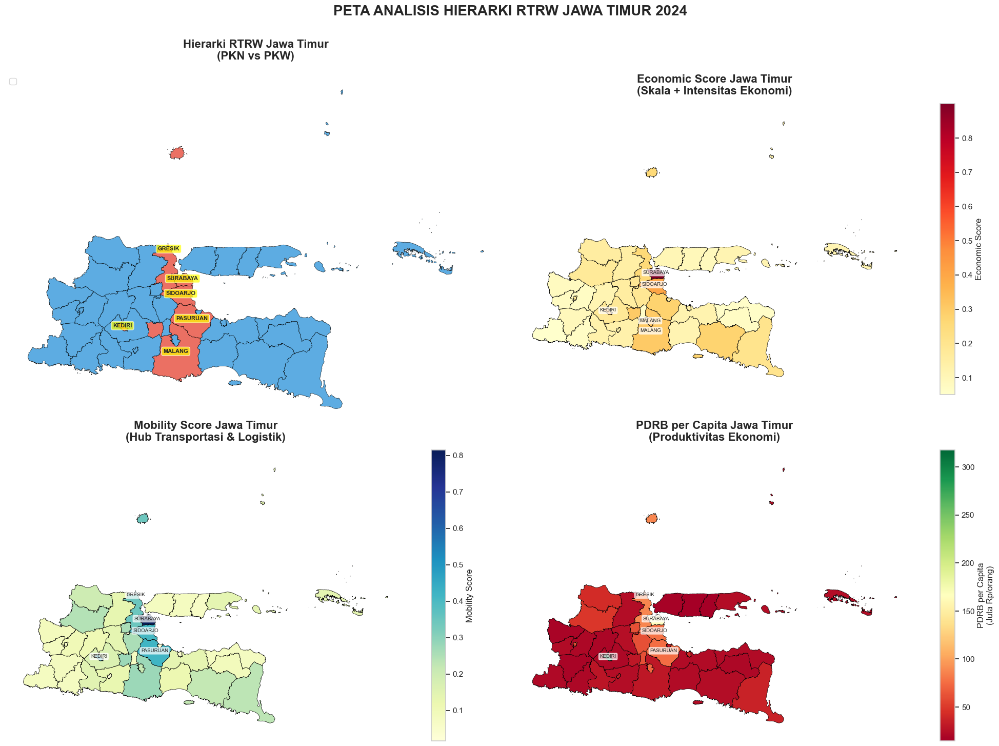


✅ VISUALISASI PETA SELESAI!


In [147]:
print("="*90)print("🗺️ MEMBUAT PETA STATIS (Matplotlib)")print("="*90)fig, axes = plt.subplots(2, 2, figsize=(20, 16))ax1 = axes[0, 0]for hierarki, color in [('PKN', '    data = gdf_merged[gdf_merged['Hierarki_RTRW'] == hierarki]    data.plot(ax=ax1, color=color, edgecolor='black', linewidth=0.5,               label=f'{hierarki} ({len(data)} wilayah)', alpha=0.8)for idx, row in gdf_merged[gdf_merged['Hierarki_RTRW'] == 'PKN'].iterrows():    centroid = row.geometry.centroid    ax1.annotate(text=row['City'].replace('KOTA ', ''),                 xy=(centroid.x, centroid.y),                ha='center', fontsize=8, fontweight='bold',                bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.7))ax1.set_title('Hierarki RTRW Jawa Timur\n(PKN vs PKW)',               fontsize=16, fontweight='bold', pad=20)ax1.legend(loc='upper left', fontsize=12)ax1.axis('off')ax2 = axes[0, 1]gdf_merged.plot(column='Economic_Score',                ax=ax2,                cmap='YlOrRd',               edgecolor='black',               linewidth=0.5,               legend=True,               legend_kwds={'label': 'Economic Score', 'shrink': 0.8})top5_eco = gdf_merged.nlargest(5, 'Economic_Score')for idx, row in top5_eco.iterrows():    centroid = row.geometry.centroid    ax2.annotate(text=row['City'].replace('KOTA ', ''),                 xy=(centroid.x, centroid.y),                ha='center', fontsize=7,                bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.7))ax2.set_title('Economic Score Jawa Timur\n(Skala + Intensitas Ekonomi)',               fontsize=16, fontweight='bold', pad=20)ax2.axis('off')ax3 = axes[1, 0]gdf_merged.plot(column='Mobility_Score',                ax=ax3,                cmap='YlGnBu',               edgecolor='black',               linewidth=0.5,               legend=True,               legend_kwds={'label': 'Mobility Score', 'shrink': 0.8})top5_mob = gdf_merged.nlargest(5, 'Mobility_Score')for idx, row in top5_mob.iterrows():    centroid = row.geometry.centroid    ax3.annotate(text=row['City'].replace('KOTA ', ''),                 xy=(centroid.x, centroid.y),                ha='center', fontsize=7,                bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.7))ax3.set_title('Mobility Score Jawa Timur\n(Hub Transportasi & Logistik)',               fontsize=16, fontweight='bold', pad=20)ax3.axis('off')ax4 = axes[1, 1]gdf_merged.plot(column='PDRB_per_Capita',                ax=ax4,                cmap='RdYlGn',               edgecolor='black',               linewidth=0.5,               legend=True,               legend_kwds={'label': 'PDRB per Capita\n(Juta Rp/orang)', 'shrink': 0.8})top5_pdrb = gdf_merged.nlargest(5, 'PDRB_per_Capita')for idx, row in top5_pdrb.iterrows():    centroid = row.geometry.centroid    ax4.annotate(text=row['City'].replace('KOTA ', ''),                 xy=(centroid.x, centroid.y),                ha='center', fontsize=7,                bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.7))ax4.set_title('PDRB per Capita Jawa Timur\n(Produktivitas Ekonomi)',               fontsize=16, fontweight='bold', pad=20)ax4.axis('off')plt.suptitle('PETA ANALISIS HIERARKI RTRW JAWA TIMUR 2024',              fontsize=20, fontweight='bold', y=0.98)plt.tight_layout(rect=[0, 0.03, 1, 0.96])map_static_path = DATA_PATH + 'peta_analisis_hierarki_rtrw_jatim.png'plt.savefig(map_static_path, dpi=300, bbox_inches='tight')print(f"\n✓ Peta statis disimpan: {map_static_path}")plt.show()print("\n" + "="*90)print("✅ VISUALISASI PETA SELESAI!")print("="*90)\n
